In [5]:
import os
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
import random
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dropout
from sklearn.model_selection import train_test_split

# Additional required imports for SAM & segmentation logic
import torch
from segment_anything import sam_model_registry, SamPredictor
import pandas as pd
from matplotlib.patches import Circle# Additional required imports for SAM & segmentation logic
import torch
from segment_anything import sam_model_registry, SamPredictor
import pandas as pd
from matplotlib.patches import Circle

2025-05-28 16:47:57.079528: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-28 16:47:58.346215: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/asma/thermal-cnn/lib/python3.7/site-packages/cv2/../../lib64:
2025-05-28 16:47:58.346294: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/asma/thermal-cnn/lib/python3.7/site-packages/cv2/../../l

In [6]:
import os
import cv2
import csv
import matplotlib.pyplot as plt
import numpy as np
from segment_anything import sam_model_registry, SamPredictor
from matplotlib.patches import Rectangle
from matplotlib.widgets import Button

In [7]:


# Label mapping: (Main Folder, Compartment Folder) → Label
compartment_labels = {
    ("VCB", "CB Close Door"): 0,
    ("VCB", "CB Open door"): 1,
    ("VCB", "3 Core Cable"): 2,
    ("VCB", "1 core cable"): 3,
    ("VCB", "Cable"): 5,
    ("VCB", "Busbar top"): 6,
    ("VCB", "Busbar side"): 7,
    ("VCB", "PT"): 10,
    
    ("RMU", "Cable Entry"): 4,
    ("RMU", "Fuse"): 8,
    ("RMU", "Cable"): 5,
    ("RMU", "PT"): 10
}

image_paths = []
labels = []

base_path = './data/resized_output'
unmatched_folders = set()

# Loop through all .png files and match the folder path pair
for root, dirs, files in os.walk(base_path):
    for file in files:
        if file.endswith('_resized.png'):
            full_path = os.path.join(root, file)
            folder_name = os.path.basename(root)  # e.g. "Cable"
            parent_folder = os.path.basename(os.path.dirname(root))  # e.g. "VCB" or "RMU"

            key = (parent_folder, folder_name)

            if key in compartment_labels:
                label = compartment_labels[key]
                image_paths.append(full_path)
                labels.append(label)
            else:
                unmatched_folders.add(key)

print(f"✅ Total labeled images: {len(image_paths)}")
print("📊 Label Distribution:", Counter(labels))

if unmatched_folders:
    print("\n🚫 Unmatched folder pairs (check for typos or missing labels):")
    for f in sorted(unmatched_folders):
        print("-", f)

✅ Total labeled images: 357
📊 Label Distribution: Counter({5: 51, 3: 40, 6: 40, 1: 40, 7: 40, 0: 40, 4: 40, 8: 40, 10: 26})


In [8]:


# Convert labels to numpy array (if not already)
label_array = np.array(labels)

# Get unique class IDs
classes = np.unique(label_array)

# Compute class weights
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=label_array)

# Store as dictionary for model use
class_weight_dict = dict(zip(classes, class_weights))

# Output the weights
print("📊 Class Weights:")
for cls, weight in class_weight_dict.items():
    print(f"Class {cls}: Weight {weight:.2f}")

📊 Class Weights:
Class 0: Weight 0.99
Class 1: Weight 0.99
Class 3: Weight 0.99
Class 4: Weight 0.99
Class 5: Weight 0.78
Class 6: Weight 0.99
Class 7: Weight 0.99
Class 8: Weight 0.99
Class 10: Weight 1.53


In [4]:


# --- 1. Load Your Images (resized: 640x480) ---
img_width = 224  # MobileNet expects smaller size
img_height = 224
num_classes = max(labels) + 1

images = []
for path in image_paths:
    img = cv2.imread(path)
    img = cv2.resize(img, (img_width, img_height))  # Resize to MobileNetV2 input
    img = img / 255.0
    images.append(img)

X = np.array(images)
y = to_categorical(labels, num_classes=num_classes)

# --- 2. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 3. Class Weights (ensure coverage) ---
label_array = np.argmax(y_train, axis=1)
classes = np.unique(label_array)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=label_array)
# Safer class weight mapping using zip
raw_weight_dict = dict(zip(classes, class_weights))
class_weight_dict = {i: raw_weight_dict.get(i, 1.0) for i in range(num_classes)}


# --- 4. Build MobileNetV2 Transfer Model ---
base_model = MobileNetV2(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3))
base_model.trainable = False  # Freeze the pretrained layers

inputs = Input(shape=(img_height, img_width, 3))
x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(num_classes, activation='softmax')(x)
model = Model(inputs, outputs)

# --- 5. Compile ---
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# --- 6. Callbacks ---
early_stop = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

# --- 7. Train ---
history = model.fit(X_train, y_train,
                    epochs=25,
                    batch_size=32,
                    validation_data=(X_test, y_test),
                    class_weight=class_weight_dict,
                    callbacks=[early_stop])

2025-05-06 10:25:19.233699: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-05-06 10:25:19.233977: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/asma/thermal-cnn/lib/python3.7/site-packages/cv2/../../lib64:
2025-05-06 10:25:19.234058: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/asma/thermal-cnn/lib/python3.7/site-packages/cv2/../../lib64:
2025-05-06 10:25:19.234129: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could no

Epoch 1/25


2025-05-06 10:25:21.524646: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 171601920 exceeds 10% of free system memory.
2025-05-06 10:25:24.142589: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 51380224 exceeds 10% of free system memory.
2025-05-06 10:25:24.175739: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 51380224 exceeds 10% of free system memory.
2025-05-06 10:25:24.193300: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 51380224 exceeds 10% of free system memory.
2025-05-06 10:25:24.215042: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 154140672 exceeds 10% of free system memory.


9/9 [==============================] - 8s 611ms/step - loss: 2.2133 - accuracy: 0.2842 - val_loss: 1.2433 - val_accuracy: 0.6667
Epoch 2/25
9/9 [==============================] - 4s 505ms/step - loss: 1.2711 - accuracy: 0.5930 - val_loss: 0.7830 - val_accuracy: 0.8194
Epoch 3/25
9/9 [==============================] - 5s 606ms/step - loss: 0.7798 - accuracy: 0.7930 - val_loss: 0.5798 - val_accuracy: 0.8472
Epoch 4/25
9/9 [==============================] - 4s 515ms/step - loss: 0.4925 - accuracy: 0.8596 - val_loss: 0.4726 - val_accuracy: 0.8611
Epoch 5/25
9/9 [==============================] - 5s 603ms/step - loss: 0.3783 - accuracy: 0.8877 - val_loss: 0.4141 - val_accuracy: 0.8750
Epoch 6/25
9/9 [==============================] - 5s 530ms/step - loss: 0.3290 - accuracy: 0.9018 - val_loss: 0.3999 - val_accuracy: 0.8750
Epoch 7/25
9/9 [==============================] - 5s 523ms/step - loss: 0.2292 - accuracy: 0.9439 - val_loss: 0.3632 - val_accuracy: 0.8889
Epoch 8/25
9/9 [===============

3/3 [==============================] - 1s 192ms/step


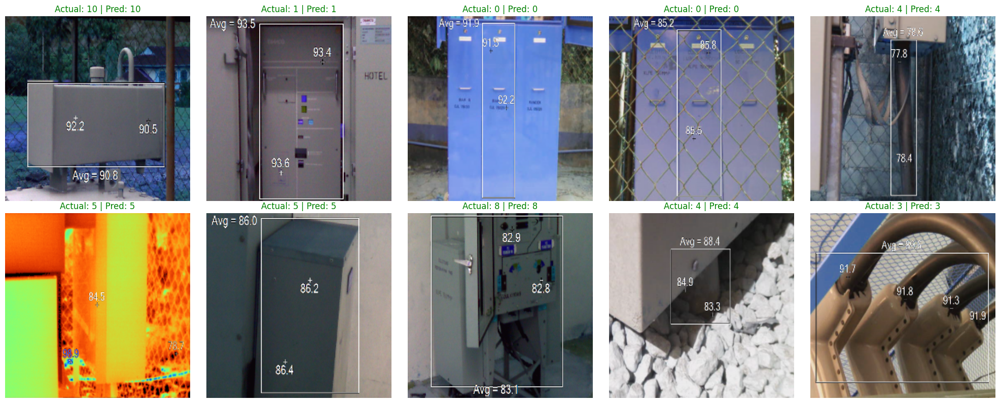

In [6]:

# --- 1. Make predictions ---
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

# --- 2. Pick 10 random indices ---
sample_indices = random.sample(range(len(X_test)), 10)

# --- 3. Plot images with predictions ---
plt.figure(figsize=(20, 8))
for i, idx in enumerate(sample_indices):
    plt.subplot(2, 5, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {y_true[idx]} | Pred: {y_pred[idx]}", fontsize=12, color='green' if y_true[idx] == y_pred[idx] else 'red')
plt.tight_layout()
plt.show()

In [12]:
import torch
from segment_anything import sam_model_registry, SamPredictor
import pandas as pd
from PIL import Image
from matplotlib.patches import Circle

# 🔧 Set up SAM model path (update if saved elsewhere)
sam_checkpoint_path = "sam_vit_b_01ec64.pth"  # Make sure this .pth file exists
model_type = "vit_b"  # or vit_h, vit_l if you downloaded those versions

# ✅ Load SAM model
device = "cpu"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint_path).to(device)
predictor = SamPredictor(sam)

In [22]:
import os
import cv2
import pandas as pd
import numpy as np

folder_path = './data/resized_output/RMU/Cable Entry'
valid_count = 0

for file in os.listdir(folder_path):
    if file.endswith('.png') and 'IR_' in file:
        img_path = os.path.join(folder_path, file)
        csv_path = img_path.replace('.png', '.csv')

        # Check image size
        img = cv2.imread(img_path)
        if img is None:
            print(f"❌ Could not read image: {file}")
            continue

        img_shape = img.shape[:2]  # (height, width)
        if img_shape != (480, 640):
            print(f"⚠️ Image {file} has shape {img_shape}, expected (480, 640)")
            continue

        # Check CSV shape
        if not os.path.exists(csv_path):
            print(f"❌ Missing CSV for {file}")
            continue

        try:
            temp_array = pd.read_csv(csv_path, header=None).values.astype(np.float32)
        except Exception as e:
            print(f"❌ Failed to load CSV for {file}: {e}")
            continue

        if temp_array.shape != (480, 640):
            print(f"⚠️ CSV shape mismatch for {file}: {temp_array.shape}")
        else:
            print(f"✅ {file} — Image and CSV both valid (640x480)")
            valid_count += 1

print(f"\n📊 Total valid image-csv pairs: {valid_count}")

✅ IR_06760_resized.png — Image and CSV both valid (640x480)
✅ IR_06850_resized.png — Image and CSV both valid (640x480)
✅ IR_07515_resized.png — Image and CSV both valid (640x480)
⚠️ Image IR_07200_resized_mask.png has shape (224, 224), expected (480, 640)
✅ IR_07406_resized.png — Image and CSV both valid (640x480)
✅ IR_07546_resized.png — Image and CSV both valid (640x480)
✅ IR_07422_resized.png — Image and CSV both valid (640x480)
⚠️ Image IR_07545_resized_mask.png has shape (224, 224), expected (480, 640)
✅ IR_07500_resized.png — Image and CSV both valid (640x480)
⚠️ Image IR_07515_resized_mask.png has shape (224, 224), expected (480, 640)
⚠️ Image IR_07414_resized_mask.png has shape (224, 224), expected (480, 640)
⚠️ Image IR_07086_resized_mask.png has shape (224, 224), expected (480, 640)
✅ IR_07136_resized.png — Image and CSV both valid (640x480)
✅ IR_07166_resized.png — Image and CSV both valid (640x480)
⚠️ Image IR_07543_resized_mask.png has shape (224, 224), expected (480, 640

In [23]:
import glob

# Folder containing the resized images and CSVs
folder_path = './data/resized_output/RMU/Cable Entry'

# Get only valid .png files that have matching .csv with correct name
valid_pairs = []
for img_path in sorted(glob.glob(os.path.join(folder_path, '*_resized.png'))):
    csv_path = img_path.replace('.png', '.csv')
    if os.path.exists(csv_path):
        img = cv2.imread(img_path)
        if img is not None and img.shape[:2] == (480, 640):
            try:
                temp = pd.read_csv(csv_path, header=None).values.astype(np.float32)
                if temp.shape == (480, 640):
                    valid_pairs.append((img_path, csv_path))
            except:
                continue

print(f"📦 Total valid image-csv pairs for SAM: {len(valid_pairs)}")

📦 Total valid image-csv pairs for SAM: 40


In [26]:
import pandas as pd
import numpy as np

# ✅ Load CSV
csv_path = './data/resized_output/RMU/Cable Entry/IR_06850_resized.csv'
temp_array = pd.read_csv(csv_path, header=None).values.astype(np.float32)

# ✅ Replace NaNs with a placeholder for clearer viewing (optional)
temp_display = np.nan_to_num(temp_array, nan=-1.0)

# ✅ Print all values
np.set_printoptions(threshold=np.inf, linewidth=200)  # Show full array
print("📄 Full Temperature Array:")
print(temp_display)

# ✅ Save to a text file for review
np.savetxt("IR_06850_resized_full_values.txt", temp_display, fmt="%.1f")
print("💾 Saved full array to 'IR_06850_resized_full_values.txt'")

📄 Full Temperature Array:
[[ -1.   -1.    1.    1.    2.    2.    3.    3.    4.    4.    5.    5.    6.    6.    7.    7.    8.    8.    9.    9.   10.   10.   11.   11.   12.   12.   13.   13.   14.   14.   15.   15.
   16.   16.   17.   17.   18.   18.   19.   19.   20.   20.   21.   21.   22.   22.   23.   23.   24.   24.   25.   25.   26.   26.   27.   27.   28.   28.   29.   29.   30.   30.   31.   31.
   32.   32.   33.   33.   34.   34.   35.   35.   36.   36.   37.   37.   38.   38.   39.   39.   40.   40.   41.   41.   42.   42.   43.   43.   44.   44.   45.   45.   46.   46.   47.   47.
   48.   48.   49.   49.   50.   50.   51.   51.   52.   52.   53.   53.   54.   54.   55.   55.   56.   56.   57.   57.   58.   58.   59.   59.   60.   60.   61.   61.   62.   62.   63.   63.
   64.   64.   65.   65.   66.   66.   67.   67.   68.   68.   69.   69.   70.   70.   71.   71.   72.   72.   73.   73.   74.   74.   75.   75.   76.   76.   77.   77.   78.   78.   79.   79.
   80.   

In [38]:
def load_smartview_csv(path):
    with open(path, 'r', encoding='utf-16', errors='ignore') as f:
        lines = f.readlines()

    matrix = []
    for line in lines:
        if line.strip() and line.strip()[0].isdigit():
            parts = line.strip().split(',')
            # Drop the first index and filter out empty strings
            row = [p for p in parts[1:] if p.strip() != '']
            try:
                matrix.append(list(map(float, row)))
            except ValueError:
                continue  # Skip malformed rows silently

    return np.array(matrix, dtype=np.float32)

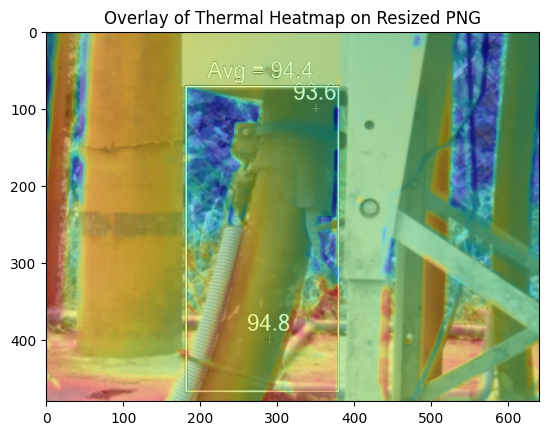

In [70]:
thermal = load_smartview_csv('data/organized1/RMU/Cable Entry/IR_06838.csv')
img = cv2.imread('data/resized_output/RMU/Cable Entry/IR_06838_resized.png')

# Ensure same shape
if thermal.shape != img.shape[:2]:
    thermal = cv2.resize(thermal, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)

plt.imshow(img)
plt.imshow(thermal, cmap='jet', alpha=0.4)
plt.title("Overlay of Thermal Heatmap on Resized PNG")
plt.show()

In [35]:
with open('data/organized1/RMU/Cable Entry/IR_07483.csv', 'r', encoding='utf-16', errors='ignore') as f:
    lines = f.readlines()

# Show first 15 lines for inspection
for i, line in enumerate(lines[:15]):
    print(f"Line {i+1}: {line.strip()}")

Line 1: All temperatures in °F.
Line 2: 
Line 3: D:\new\15-03-2023\38.PE KG SUNGAI SATAN\IR_07483.IS2
Line 4: 
Line 5: ,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,

In [48]:
import numpy as np
import csv

def load_smartview_csv(path):
    with open(path, 'r', encoding='utf-16') as f:
        reader = csv.reader(f)
        rows = list(reader)

    data_rows = []
    for row in rows:
        if not row or not row[0].strip().isdigit():
            continue
        try:
            data_rows.append([float(val) for val in row[1:] if val.strip() != ''])
        except ValueError:
            continue

    return np.array(data_rows, dtype=np.float32)

In [62]:
thermal = load_smartview_csv('data/organized1/RMU/Cable Entry/IR_06756.csv')
print(thermal.shape)

(240, 320)


In [63]:
# Resize image to match thermal dimensions
resized_img = cv2.resize(img, (thermal.shape[1], thermal.shape[0]))

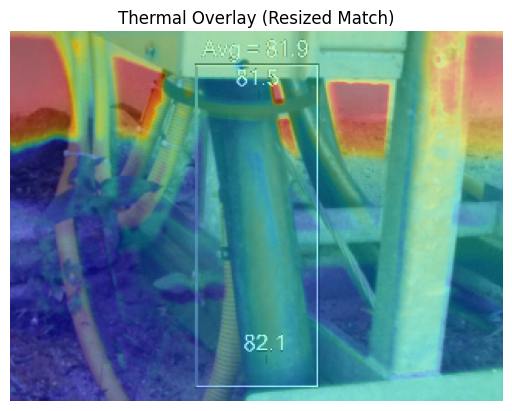

In [64]:
import matplotlib.pyplot as plt
import cv2

thermal = load_smartview_csv('data/organized1/RMU/Cable Entry/IR_06756.csv')
img = cv2.imread('data/organized1/RMU/Cable Entry/IR_06756.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Resize image to match thermal
resized_img = cv2.resize(img, (thermal.shape[1], thermal.shape[0]))

plt.imshow(resized_img)
plt.imshow(thermal, cmap='jet', alpha=0.4)
plt.axis('off')
plt.title('Thermal Overlay (Resized Match)')
plt.show()

🔍 Processing: IR_07064.csv


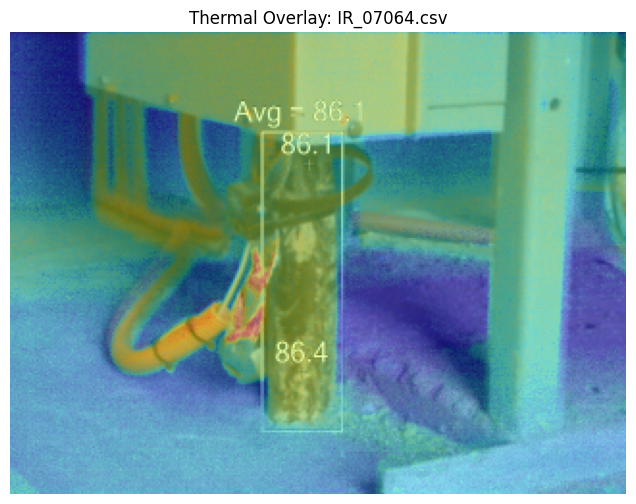

🔍 Processing: IR_07502.csv


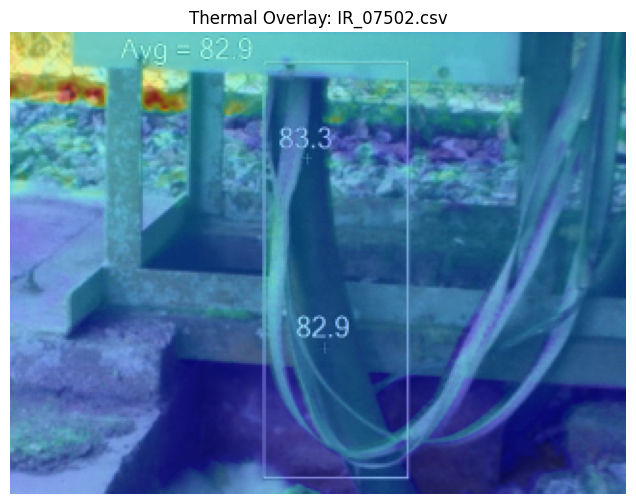

🔍 Processing: IR002365.csv


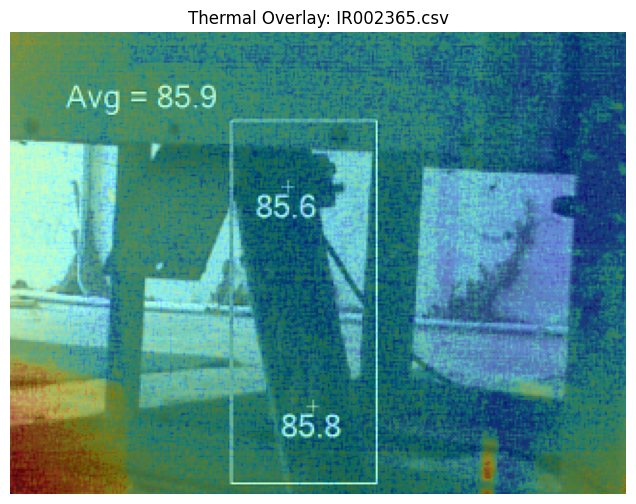

🔍 Processing: IR_07414.csv


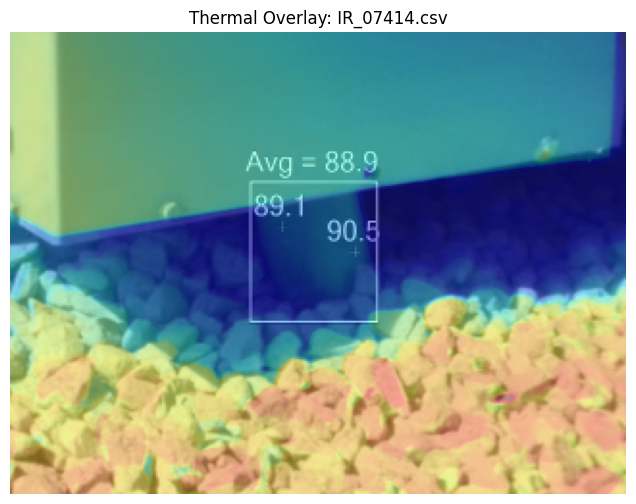

🔍 Processing: IR_07048.csv


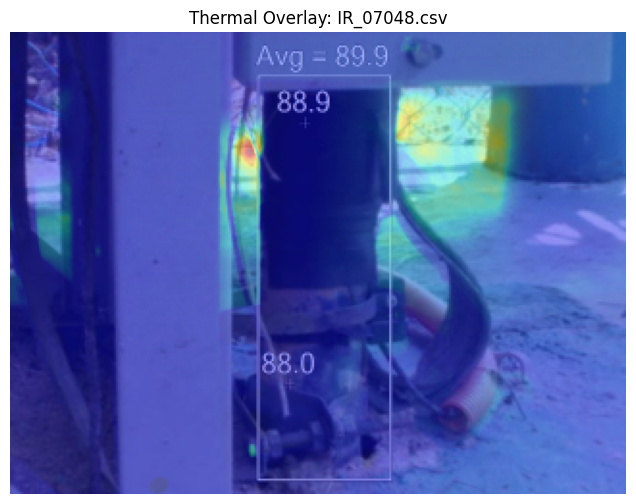

🔍 Processing: IR_07066.csv


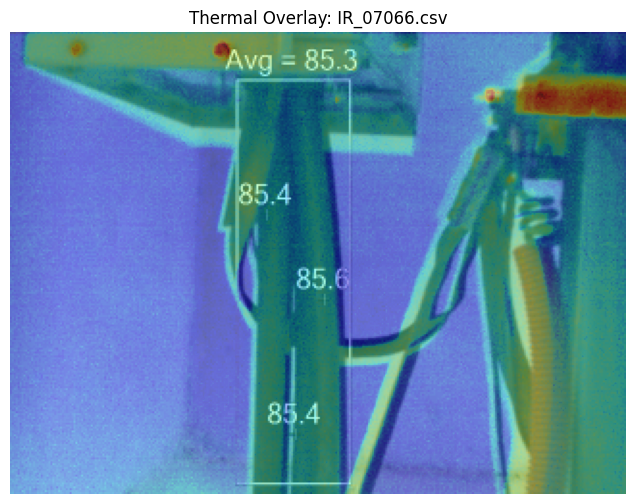

🔍 Processing: IR_07545.csv


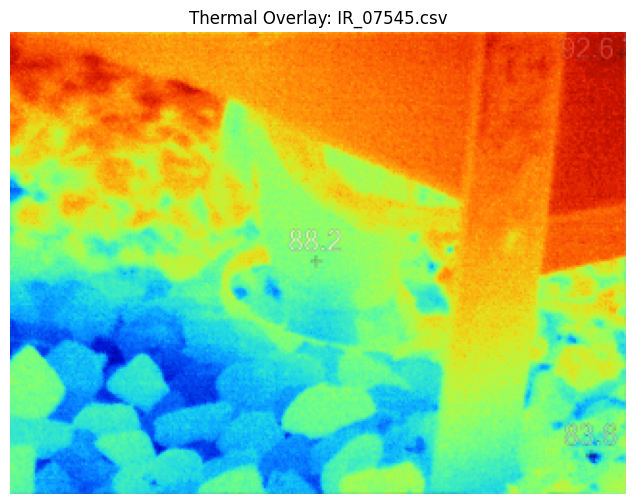

🔍 Processing: IR_07030.csv


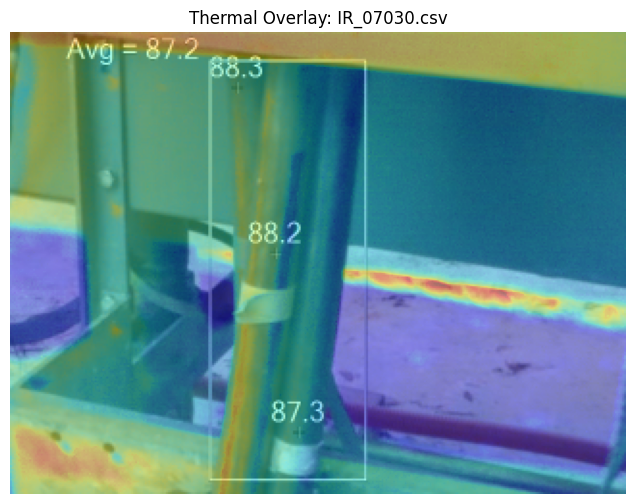

🔍 Processing: IR_07136.csv


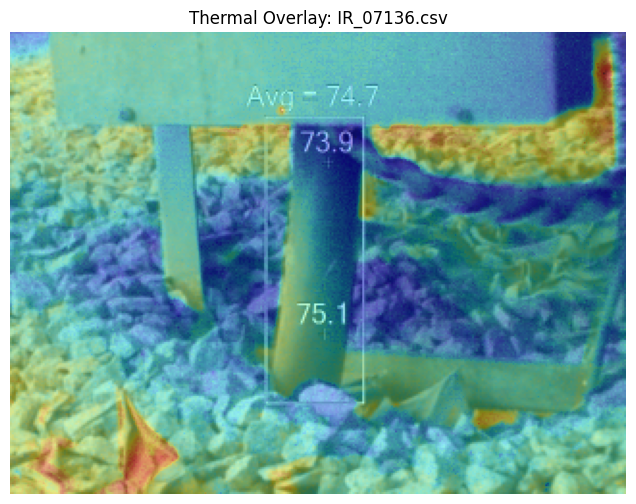

🔍 Processing: IR_07483.csv


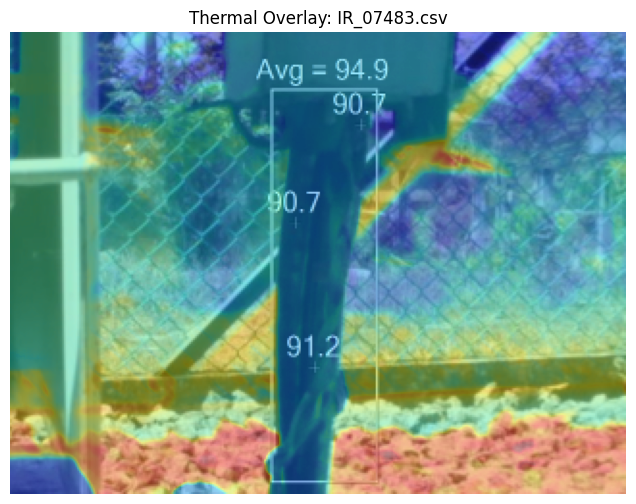

In [85]:
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt

def load_smartview_csv(path):
    with open(path, 'r', encoding='utf-16', errors='ignore') as f:
        lines = f.readlines()

    matrix = []
    for line in lines:
        if line.strip() and line.strip()[0].isdigit():
            parts = line.strip().split(',')
            row = [p for p in parts[1:] if p.strip() != '']
            try:
                matrix.append(list(map(float, row)))
            except ValueError:
                continue  # skip bad rows

    return np.array(matrix, dtype=np.float32)

# Base paths
base_dir = './data/organized1/RMU/Cable Entry'
img_dir = './data/resized_output/RMU/Cable Entry'

# Pick 10 random .csv files
all_csvs = [f for f in os.listdir(base_dir) if f.endswith('.csv')]
random_files = random.sample(all_csvs, 10)

for fname in random_files:
    csv_path = os.path.join(base_dir, fname)
    img_name = fname.replace('.csv', '_resized.png')
    img_path = os.path.join(img_dir, img_name)

    print(f"🔍 Processing: {fname}")

    try:
        thermal = load_smartview_csv(csv_path)
        if thermal.size == 0:
            print(f"⚠️ Empty or invalid thermal data in: {csv_path}")
            continue

        img = cv2.imread(img_path)
        if img is None:
            print(f"❌ Image not found: {img_path}")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Resize image to match thermal shape
        resized_img = cv2.resize(img, (thermal.shape[1], thermal.shape[0]))

        plt.figure(figsize=(8, 6))
        plt.imshow(resized_img)
        plt.imshow(thermal, cmap='jet', alpha=0.4)
        plt.title(f'Thermal Overlay: {fname}')
        plt.axis('off')
        plt.show()

    except Exception as e:
        print(f"❌ Failed to process {csv_path}: {e}")

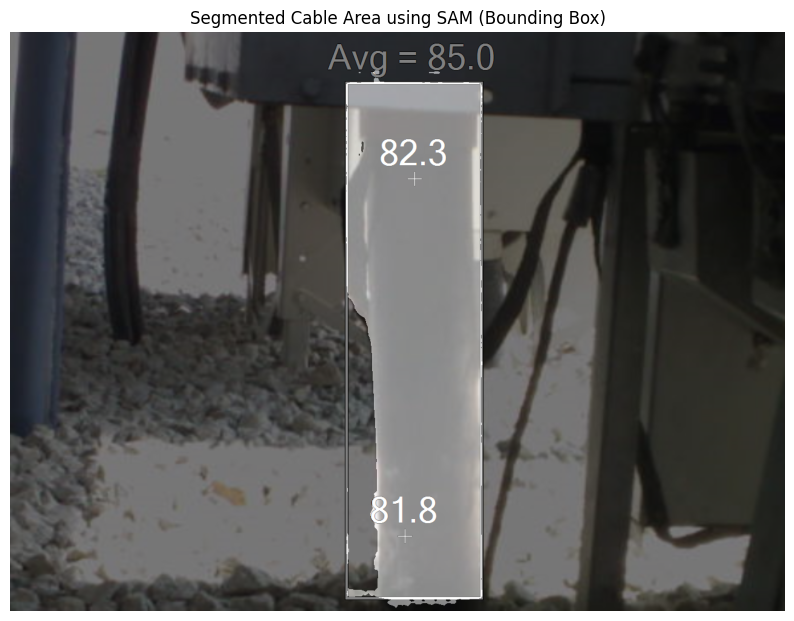

In [103]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
import torch

# Load SAM model
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
predictor = SamPredictor(sam)
sam.to(device="cpu")

# Load RGB image
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Set image to predictor
predictor.set_image(image_rgb)

# Choose a tight bounding box around the cable
input_box = np.array([[550, 50, 800, 950]])  # Adjust this for your specific cable region

# Run segmentation with bounding box
masks, scores, logits = predictor.predict(
    box=input_box,
    multimask_output=True
)

# Choose the best mask based on the highest score
best_mask = masks[np.argmax(scores)]

# Show the segmented result
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.imshow(best_mask, alpha=0.5, cmap='gray')
plt.title("Segmented Cable Area using SAM (Bounding Box)")
plt.axis('off')
plt.show()

In [2]:
def show_grid(image, grid_size=50):
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(image)
    ax.set_xticks(np.arange(0, image.shape[1], grid_size), minor=False)
    ax.set_yticks(np.arange(0, image.shape[0], grid_size), minor=False)
    ax.grid(True, which='major', color='white', linestyle='--', linewidth=0.5)
    return fig, ax

def run_sam_predictor(predictor, image, point):
    predictor.set_image(image)
    input_point = np.array([point])
    input_label = np.array([1])
    masks, scores, _ = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True
    )
    return masks, scores

In [3]:
def annotate_images(image_dir, save_dir, output_csv, sam_model_path, device="cuda", image_size=(320, 240)):
    os.makedirs(save_dir, exist_ok=True)
    image_paths = []
    for root, _, files in os.walk(image_dir):
        for f in files:
            if f.endswith(".png"):
                image_paths.append(os.path.join(root, f))

    # Load SAM
    model_type = "vit_b"
    sam = sam_model_registry[model_type](checkpoint=sam_model_path)
    sam.to(device)
    predictor = SamPredictor(sam)

    with open(output_csv, 'w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(['image_path', 'label', 'x', 'y', 'mask_index'])

        for path in image_paths:
            image = cv2.imread(path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, image_size)

            fig, ax = show_grid(image)
            clicked = []

            def onclick(event):
                if event.xdata and event.ydata:
                    clicked.clear()
                    clicked.append((int(event.xdata), int(event.ydata)))
                    plt.close()

            cid = fig.canvas.mpl_connect('button_press_event', onclick)
            plt.title(f"Click on SAM dot for: {os.path.basename(path)}")
            plt.show()

            if not clicked:
                continue

            x, y = clicked[0]
            masks, scores = run_sam_predictor(predictor, image, (x, y))

            # Show all masks
            for i, (mask, score) in enumerate(zip(masks, scores)):
                plt.figure(figsize=(8, 6))
                plt.imshow(image)
                plt.imshow(mask, cmap='jet', alpha=0.4)
                plt.title(f"Mask {i+1} | Score: {score:.3f}")
                plt.axis('off')
                plt.show()

            selected = int(input(f"Select best mask index (0-{len(masks)-1}) for {os.path.basename(path)}: "))
            label = os.path.basename(os.path.dirname(path))

            # Save dotted image
            dotted_img = image.copy()
            cv2.circle(dotted_img, (x, y), 5, (255, 0, 0), -1)
            dotted_path = os.path.join(save_dir, f"{label}_{os.path.basename(path)}")
            cv2.imwrite(dotted_path, cv2.cvtColor(dotted_img, cv2.COLOR_RGB2BGR))

            # Save record
            writer.writerow([dotted_path, label, x, y, selected])

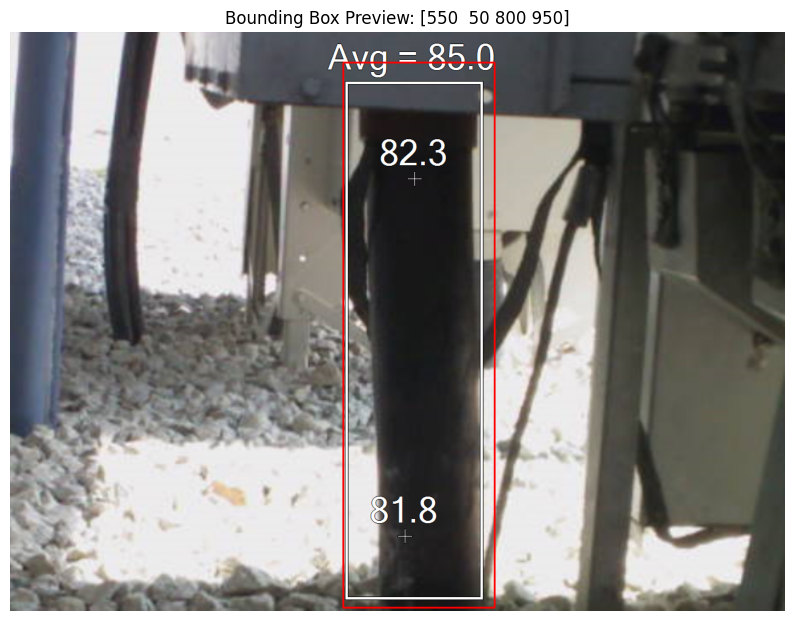

In [101]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
import torch

# Load SAM model
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
predictor = SamPredictor(sam)
sam.to(device="cpu")

# Load RGB image
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Set image to predictor
predictor.set_image(image_rgb)

# Initial bounding box (you can adjust these values)
input_box = np.array([[550, 50, 800, 950]])

# Draw the bounding box on the image
boxed_image = image_rgb.copy()
cv2.rectangle(boxed_image, (input_box[0][0], input_box[0][1]), (input_box[0][2], input_box[0][3]), (255, 0, 0), 2)

# Show the image with the bounding box
plt.figure(figsize=(10, 10))
plt.imshow(boxed_image)
plt.title(f"Bounding Box Preview: {input_box[0]}")
plt.axis('off')
plt.show()

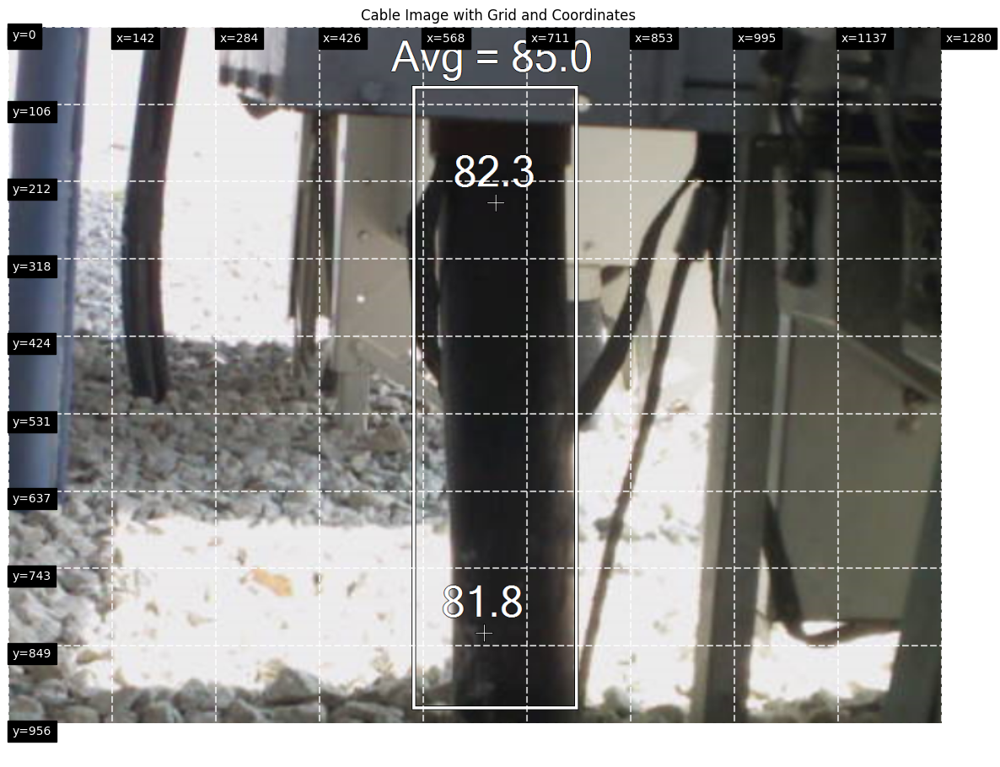

In [102]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Load RGB image
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot the image with grid
plt.figure(figsize=(15, 15))
plt.imshow(image_rgb)

# Add grid and labels
height, width, _ = image_rgb.shape
grid_x = np.linspace(0, width, 10, dtype=int)
grid_y = np.linspace(0, height, 10, dtype=int)

for x in grid_x:
    plt.axvline(x, color='white', linestyle='--', alpha=0.7)
    plt.text(x + 5, 20, f'x={x}', color='white', fontsize=10, backgroundcolor='black')

for y in grid_y:
    plt.axhline(y, color='white', linestyle='--', alpha=0.7)
    plt.text(5, y + 15, f'y={y}', color='white', fontsize=10, backgroundcolor='black')

# Show the image
plt.title("Cable Image with Grid and Coordinates")
plt.axis('off')
plt.show()

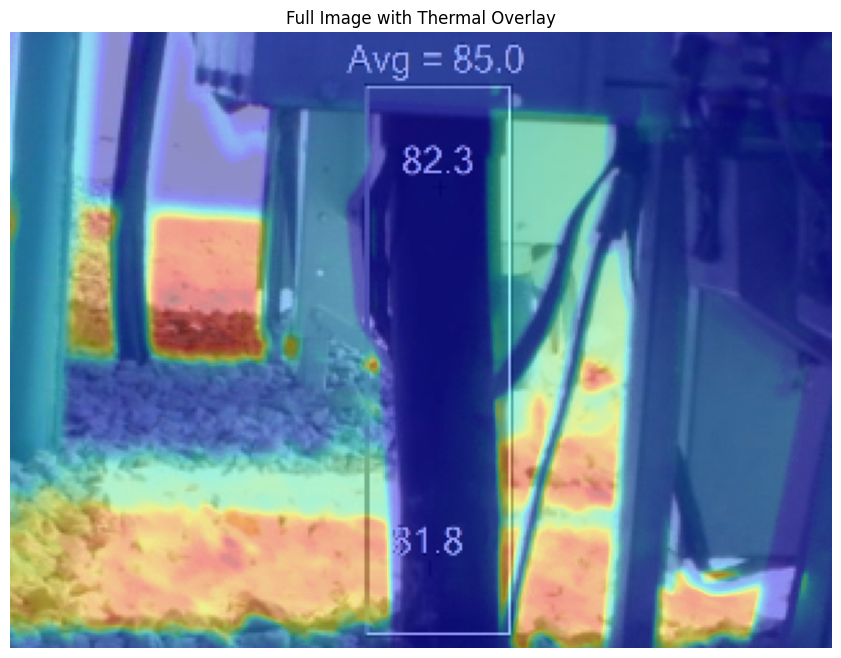

In [104]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import csv

def load_smartview_csv(path):
    with open(path, 'r', encoding='utf-16', errors='ignore') as f:
        reader = csv.reader(f)
        rows = list(reader)

    # Extract only rows with numeric data
    data_rows = []
    for row in rows:
        if row and row[0].strip().isdigit():
            try:
                data_rows.append([float(val) for val in row[1:] if val.strip()])
            except ValueError:
                continue

    return np.array(data_rows, dtype=np.float32)

# File paths
csv_path = 'data/organized1/RMU/Cable Entry/IR_07412.csv'
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'

# Load data
thermal = load_smartview_csv(csv_path)
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize image to match thermal
if thermal.shape != image_rgb.shape[:2]:
    image_rgb = cv2.resize(image_rgb, (thermal.shape[1], thermal.shape[0]))

# Overlay full heatmap
plt.figure(figsize=(12, 8))
plt.imshow(image_rgb)
plt.imshow(thermal, cmap='jet', alpha=0.4)
plt.title("Full Image with Thermal Overlay")
plt.axis('off')
plt.show()

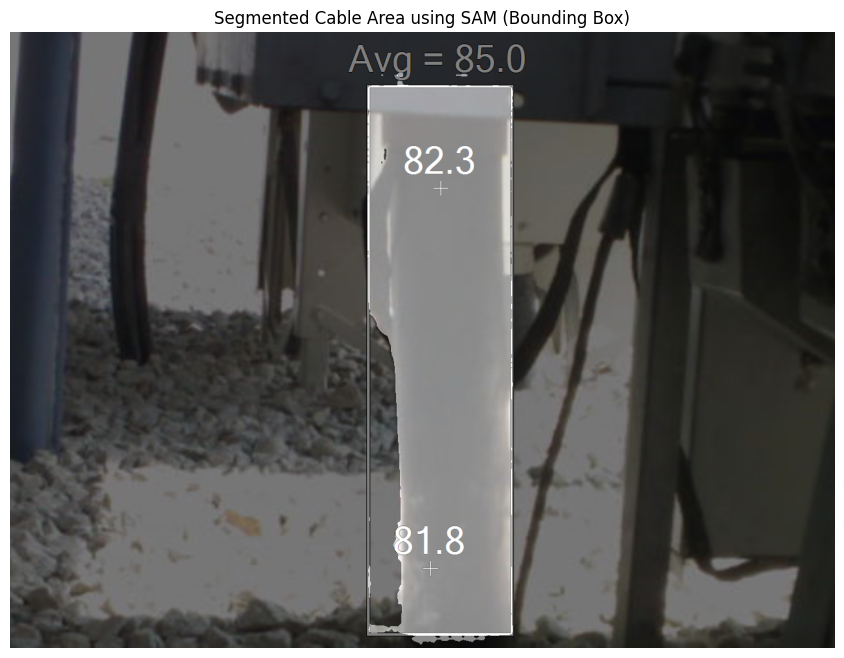

Input Box Coordinates: [[550  50 800 950]]


In [107]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
import torch

# Load SAM model
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
predictor = SamPredictor(sam)
sam.to(device="cpu")

# Load RGB image
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Set image to predictor
predictor.set_image(image_rgb)

# Set the bounding box (adjust as needed)
input_box = np.array([[550, 50, 800, 950]])  # [x_min, y_min, x_max, y_max]

# Predict mask using the bounding box
masks, scores, logits = predictor.predict(box=input_box, multimask_output=True)

# Choose the best mask
best_mask = masks[np.argmax(scores)]

# Show the segmented cable
plt.figure(figsize=(12, 8))
plt.imshow(image_rgb)
plt.imshow(best_mask, alpha=0.5, cmap='gray')
plt.title("Segmented Cable Area using SAM (Bounding Box)")
plt.axis('off')
plt.show()

# Print the box for confirmation
print(f"Input Box Coordinates: {input_box}")


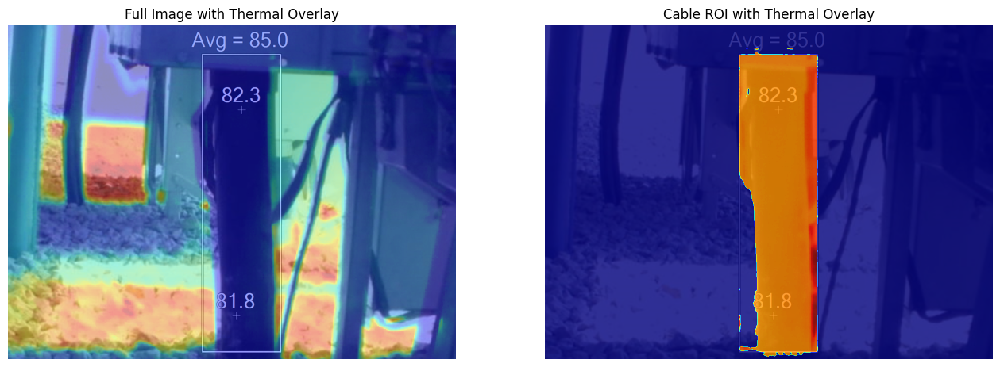

In [109]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
import torch
import csv

# Load SAM model
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
predictor = SamPredictor(sam)
sam.to(device="cpu")

# Load RGB image
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'
thermal_csv_path = 'data/organized1/RMU/Cable Entry/IR_07412.csv'
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Set image to predictor
predictor.set_image(image_rgb)

# Use the bounding box for the cable (adjust as needed)
input_box = np.array([[550, 50, 800, 950]])  # Adjust these coordinates as needed
masks, scores, logits = predictor.predict(box=input_box, multimask_output=True)
best_mask = masks[np.argmax(scores)]

# Load thermal data (with proper encoding)
def load_smartview_csv(path):
    with open(path, 'r', encoding='utf-16', errors='ignore') as f:
        reader = csv.reader(f)
        rows = list(reader)

    data_rows = []
    for row in rows:
        # Skip empty rows and rows without numerical data
        if not row or not row[0].strip().isdigit():
            continue
        try:
            data_rows.append([float(val) for val in row[1:] if val.strip() != ''])
        except ValueError:
            continue

    return np.array(data_rows, dtype=np.float32)

thermal = load_smartview_csv(thermal_csv_path)

# Resize thermal to match image size
thermal_resized = cv2.resize(thermal, (image_rgb.shape[1], image_rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

# Create masked thermal data
cable_masked_thermal = np.zeros_like(thermal_resized)
cable_masked_thermal[best_mask] = thermal_resized[best_mask]

# Plot the results
plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.imshow(thermal_resized, cmap='jet', alpha=0.4)
plt.title("Full Image with Thermal Overlay")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image_rgb)
plt.imshow(cable_masked_thermal, cmap='jet', alpha=0.8)
plt.title("Cable ROI with Thermal Overlay")
plt.axis('off')

plt.show()

Max Temp: 108.30°F
Min Temp: 80.80°F
Temperature Delta: 27.50°F
Status: NORMAL


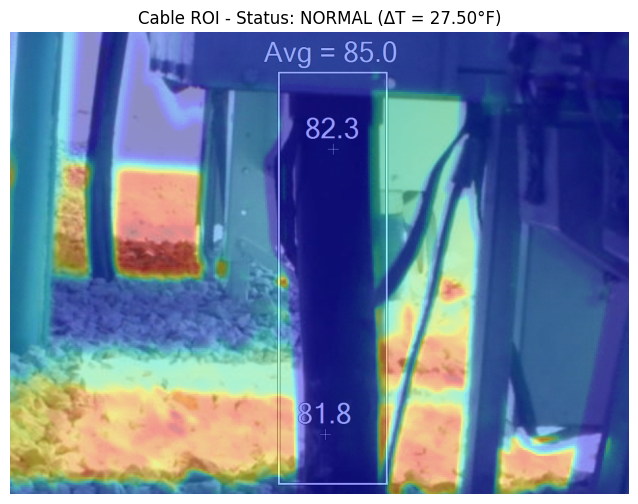

In [111]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
import torch
import csv

# Load SAM model
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
predictor = SamPredictor(sam)
sam.to(device="cpu")

# Load RGB image
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'
thermal_csv_path = 'data/organized1/RMU/Cable Entry/IR_07412.csv'
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Set image to predictor
predictor.set_image(image_rgb)

# Use the bounding box for the cable (adjust as needed)
input_box = np.array([[550, 50, 800, 950]])  # Adjust these coordinates as needed
masks, scores, logits = predictor.predict(box=input_box, multimask_output=True)
best_mask = masks[np.argmax(scores)]

# Load thermal data
def load_smartview_csv(path):
    with open(path, 'r', encoding='utf-16', errors='ignore') as f:
        reader = csv.reader(f)
        rows = list(reader)

    data_rows = []
    for row in rows:
        # Skip empty rows and rows without numerical data
        if not row or not row[0].strip().isdigit():
            continue
        try:
            data_rows.append([float(val) for val in row[1:] if val.strip() != ''])
        except ValueError:
            continue

    return np.array(data_rows, dtype=np.float32)

thermal = load_smartview_csv(thermal_csv_path)

# Resize thermal to match image size
thermal_resized = cv2.resize(thermal, (image_rgb.shape[1], image_rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

# Extract the ROI based on the segmentation mask
cable_temps = thermal_resized[best_mask]

# Calculate Delta
max_temp = np.max(cable_temps)
min_temp = np.min(cable_temps)
delta_temp = max_temp - min_temp

# Check for defect
is_defect = delta_temp > 33.8
status = "DEFECT" if is_defect else "NORMAL"

# Print the result
print(f"Max Temp: {max_temp:.2f}°F")
print(f"Min Temp: {min_temp:.2f}°F")
print(f"Temperature Delta: {delta_temp:.2f}°F")
print(f"Status: {status}")

# Plot the result
plt.figure(figsize=(12, 6))
plt.imshow(image_rgb)
plt.imshow(thermal_resized, cmap='jet', alpha=0.4)
plt.title(f"Cable ROI - Status: {status} (ΔT = {delta_temp:.2f}°F)")
plt.axis('off')
plt.show()

Max Temp: 108.30°F
Min Temp: 80.80°F
Temperature Delta: 27.50°F
Status: NORMAL


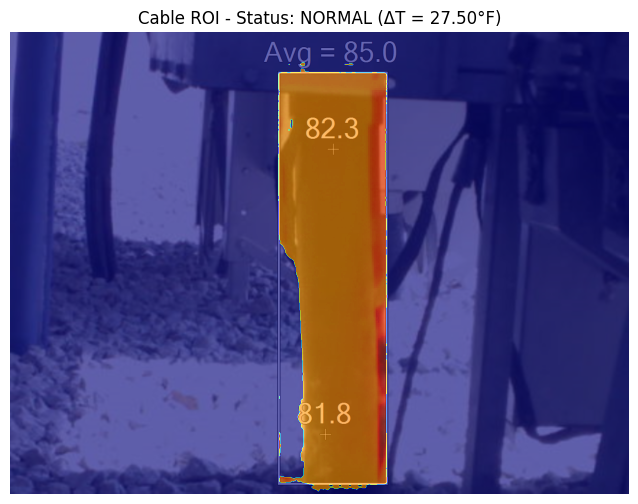

In [112]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
import torch
import csv

# Load SAM model
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
predictor = SamPredictor(sam)
sam.to(device="cpu")

# Load RGB image
img_path = 'data/organized1/RMU/Cable Entry/IR_07412.png'
thermal_csv_path = 'data/organized1/RMU/Cable Entry/IR_07412.csv'
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Set image to predictor
predictor.set_image(image_rgb)

# Use the bounding box for the cable (adjust as needed)
input_box = np.array([[550, 50, 800, 950]])  # Adjust these coordinates as needed
masks, scores, logits = predictor.predict(box=input_box, multimask_output=True)
best_mask = masks[np.argmax(scores)]

# Load thermal data
def load_smartview_csv(path):
    with open(path, 'r', encoding='utf-16', errors='ignore') as f:
        reader = csv.reader(f)
        rows = list(reader)

    data_rows = []
    for row in rows:
        # Skip empty rows and rows without numerical data
        if not row or not row[0].strip().isdigit():
            continue
        try:
            data_rows.append([float(val) for val in row[1:] if val.strip() != ''])
        except ValueError:
            continue

    return np.array(data_rows, dtype=np.float32)

thermal = load_smartview_csv(thermal_csv_path)

# Resize thermal to match image size
thermal_resized = cv2.resize(thermal, (image_rgb.shape[1], image_rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

# Extract the ROI based on the segmentation mask
cable_temps = thermal_resized[best_mask]

# Calculate Delta
max_temp = np.max(cable_temps)
min_temp = np.min(cable_temps)
delta_temp = max_temp - min_temp

# Check for defect
is_defect = delta_temp > 33.8
status = "DEFECT" if is_defect else "NORMAL"

# Print the result
print(f"Max Temp: {max_temp:.2f}°F")
print(f"Min Temp: {min_temp:.2f}°F")
print(f"Temperature Delta: {delta_temp:.2f}°F")
print(f"Status: {status}")

# Apply mask to the thermal image for visualization
thermal_segmented = np.zeros_like(thermal_resized)
thermal_segmented[best_mask] = thermal_resized[best_mask]

# Plot the segmented ROI with thermal overlay
plt.figure(figsize=(12, 6))
plt.imshow(image_rgb)
plt.imshow(thermal_segmented, cmap='jet', alpha=0.6)
plt.title(f"Cable ROI - Status: {status} (ΔT = {delta_temp:.2f}°F)")
plt.axis('off')
plt.show()

In [4]:
annotate_images(
    image_dir='./data/resized_output/RMU',       # Your RMU images
    save_dir='./labeled_images',                 # Dotted output
    output_csv='./labeled_points.csv',           # Labels for training
    sam_model_path='sam_vit_b_01ec64.pth',       # Your SAM checkpoint
    device='cuda'  # or 'cpu' if no GPU
)

RuntimeError: No CUDA GPUs are available